# Modèle

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import squarify
import time as time
import plotly.graph_objs as go
%matplotlib inline

from glob import glob

# import warnings
# warnings.filterwarnings('ignore')

# Traitement des commentaires
import re, nltk, spacy, string
import pt_core_news_sm
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from wordcloud import WordCloud

# Modèle
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import NMF
from sklearn.ensemble import IsolationForest
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
import sklearn.cluster as cluster
from sklearn import decomposition
from scipy.cluster.hierarchy import dendrogram
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import adjusted_mutual_info_score
from sklearn import preprocessing
from sklearn.metrics import make_scorer
from sklearn.model_selection import GridSearchCV
from kmodes.kmodes import KModes
from kmodes.kprototypes import KPrototypes
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# PCA
from sklearn.decomposition import PCA

from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cut_tree

from fonction import *
from tqdm.auto import tqdm

tqdm.pandas()

In [2]:
def pca_clusters(dataframe, algorithm, args, kwds):
    """
    Fonction permettant de générer une projection PCA de clusters

    Entrée :
    - dataframe - unscaled dataframe
    - algorithm - algorithme de clustering
    - args - arguments de l'algorithme, liste
    - kwds - paramètres de l'algorithme, dictionnaire

    Sortie :
    - Aucun (nuage de points 3D interactif)
    """
    start_time = time.time()
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(dataframe)
    labels = algorithm(*args, **kwds).fit_predict(scaled_data)
    pca = decomposition.PCA(n_components=2).fit(scaled_data)
    X_projected = pca.transform(scaled_data)
    pca_df = pd.DataFrame(X_projected)
    pca_df['cluster'] = labels
    pca_df.columns = ['x1', 'x2', 'cluster']
    end_time = time.time()
    sns.set(rc={'figure.figsize': (11.7, 8.27)})
    sns.scatterplot(data=pca_df,
                    x='x1',
                    y='x2',
                    hue='cluster',
                    legend="full",
                    alpha=0.7).set_title('Clusters trouvés par {}'.format(
                        str(algorithm.__name__)))
    print(f"Le clustering a pris {round(end_time - start_time)}s")

Reprenons notre RFM et faisons une autre dataframe avec des features différentes, nous pourrons comparer les deux par la suite.

In [3]:
rfm_df = pd.read_csv("data/RFM.csv")
df = pd.read_csv(r'data/df.csv')

In [4]:
df.columns

Index(['Unnamed: 0', 'order_id', 'customer_id', 'order_status',
       'order_purchase_timestamp', 'order_approved_at',
       'order_delivered_carrier_date', 'order_delivered_customer_date',
       'order_estimated_delivery_date', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'customer_unique_id',
       'customer_zip_code_prefix', 'customer_city', 'customer_state',
       'order_item_id', 'product_id', 'seller_id', 'shipping_limit_date',
       'price', 'freight_value', 'seller_zip_code_prefix', 'seller_city',
       'seller_state', 'review_id', 'review_score', 'review_comment_title',
       'review_comment_message', 'review_creation_date',
       'review_answer_timestamp', 'product_category_name', 'product_name_len',
       'product_description_len', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'product_category_name_english', 'total_payment', 'diff_days'],
      dtype='o

# Segmentation RFM

Segmentons notre RFM, nous allons manuellement "clusteriser" nos clients allant des meilleurs aux moins fidèles/dépensiers.

Nous pourrons comparer le résultat avec les modèles de machine learning que nous ferons par la suite.

In [5]:
quantiles = rfm_df.quantile(q=[0.25, 0.5, 0.75])
quantiles

,Unnamed: 0,monetary,frequency,recency
0.25,23348.5,77.11,1.0,118.0
0.50,46697.0,189.16,1.0,222.0
0.75,70045.5,554.90,1.0,351.0


In [6]:
quantiles.to_dict()

{'Unnamed: 0': {0.25: 23348.5, 0.5: 46697.0, 0.75: 70045.5},
 'monetary': {0.25: 77.11, 0.5: 189.16, 0.75: 554.9},
 'frequency': {0.25: 1.0, 0.5: 1.0, 0.75: 1.0},
 'recency': {0.25: 118.0, 0.5: 222.0, 0.75: 351.0}}

In [7]:
# Arguments (x = value, p = recency, monetary_value, frequency, d = quartiles dict)
def RScore(x, p, d):
    if x <= d[p][0.25]:
        return 4
    elif x <= d[p][0.50]:
        return 3
    elif x <= d[p][0.75]:
        return 2
    else:
        return 1


# Arguments (x = value, p = recency, monetary_value, frequency, d = quartiles dict)
def FMScore(x, p, d):
    if x <= d[p][0.25]:
        return 1
    elif x <= d[p][0.50]:
        return 2
    elif x <= d[p][0.75]:
        return 3
    else:
        return 4

In [8]:
# Creatuin de la df rfm segmentée
rfm_segmentation = rfm_df
rfm_segmentation['R_Quartile'] = rfm_segmentation['recency'].apply(
    RScore, args=(
        'recency',
        quantiles,
    ))
rfm_segmentation['F_Quartile'] = rfm_segmentation['frequency'].apply(
    FMScore, args=(
        'frequency',
        quantiles,
    ))
rfm_segmentation['M_Quartile'] = rfm_segmentation['monetary'].apply(
    FMScore, args=(
        'monetary',
        quantiles,
    ))

In [9]:
rfm_segmentation.head()

,Unnamed: 0,customer_unique_id,monetary,frequency,recency,R_Quartile,F_Quartile,M_Quartile
0,0,0000366f3b9a7992bf8c76cfdf3221e2,1135.20,1,115,4,1,4
1,1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,1,118,4,1,1
2,2,0000f46a3911fa3c0805444483337064,689.76,1,541,1,1,4
3,3,0000f6ccb0745a6a4b88665a16c9f078,174.48,1,325,2,1,2
4,4,0004aac84e0df4da2b147fca70cf8255,1181.34,1,292,2,1,4


Maintenant que nous avons le score de chaque client, nous pouvons représenter notre segmentation client. Tout d'abord, nous devons combiner les scores (R_Quartile, F_Quartile, M_Quartile) ensemble.

In [10]:
rfm_segmentation['RFMScore'] = rfm_segmentation.R_Quartile.map(str) \
                            + rfm_segmentation.F_Quartile.map(str) \
                            + rfm_segmentation.M_Quartile.map(str)
rfm_segmentation.head()

,Unnamed: 0,customer_unique_id,monetary,frequency,recency,R_Quartile,F_Quartile,M_Quartile,RFMScore
0,0,0000366f3b9a7992bf8c76cfdf3221e2,1135.20,1,115,4,1,4,414
1,1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,1,118,4,1,1,411
2,2,0000f46a3911fa3c0805444483337064,689.76,1,541,1,1,4,114
3,3,0000f6ccb0745a6a4b88665a16c9f078,174.48,1,325,2,1,2,212
4,4,0004aac84e0df4da2b147fca70cf8255,1181.34,1,292,2,1,4,214


- Meilleur score de récence = 4 : achat le plus récent. 
- Meilleur score de fréquence = 4 : achat le plus fréquent. 
- Meilleur score monétaire = 4 : à dépenser le plus.

Voyons qui sont les meilleurs clients.

In [11]:
rfm_segmentation[rfm_segmentation['RFMScore'] == 444].sort_values(
    'monetary', ascending=False).head(10)

,Unnamed: 0,customer_unique_id,monetary,frequency,recency,R_Quartile,F_Quartile,M_Quartile,RFMScore


Combien de clients avons-nous dans chaque segment ?

In [12]:
# Nous passons le type de la colonne de str à int
rfm_segmentation['RFMScore'] = rfm_segmentation['RFMScore'].astype(int)

In [13]:
# Catégorisation des clients en fonction de leurs score
print("Meilleurs clients: ",
      len(rfm_segmentation[rfm_segmentation['RFMScore'] == 444]))
print('Client les plus fidèles: ',
      len(rfm_segmentation[rfm_segmentation['F_Quartile'] == 4]))
print("Clients les plus dépensiers: ",
      len(rfm_segmentation[rfm_segmentation['M_Quartile'] == 4]))
print('Les clients moyens: ',
      len(rfm_segmentation[rfm_segmentation['RFMScore'] == 244]))
print('Les clients faiblement actifs: ',
      len(rfm_segmentation[rfm_segmentation['RFMScore'] == 144]))
print('Les clients les moins actifs: ',
      len(rfm_segmentation[rfm_segmentation['RFMScore'] == 111]))

Meilleurs clients:  385
Client les plus fidèles:  2807
Clients les plus dépensiers:  23348
Les clients moyens:  354
Les clients faiblement actifs:  284
Les clients les moins actifs:  5581


Créons un dictionnaire de nos clients en les classant par catégorie.

In [14]:
dict_segment_client = {
    "Meilleurs clients":
    len(rfm_segmentation[rfm_segmentation['RFMScore'] == 444]),
    "Les plus fidèles":
    len(rfm_segmentation[rfm_segmentation['F_Quartile'] == 4]),
    "Les plus dépensiers":
    len(rfm_segmentation[rfm_segmentation['M_Quartile'] == 4]),
    "Les clients moyens":
    len(rfm_segmentation[rfm_segmentation['RFMScore'] == 244]),
    "Les clients faiblement actifs":
    len(rfm_segmentation[rfm_segmentation['RFMScore'] == 144]),
    "Les clients les moins actifs":
    len(rfm_segmentation[rfm_segmentation['RFMScore'] == 111])
}

dict_segment_client

{'Meilleurs clients': 385,
 'Les plus fidèles': 2807,
 'Les plus dépensiers': 23348,
 'Les clients moyens': 354,
 'Les clients faiblement actifs': 284,
 'Les clients les moins actifs': 5581}

Nous allons faire un deuxième dictionnaire qui aura cette fois-ci pour valeur les pourcentages, cela nous permettra de correctement labéliser notre graphique.

In [15]:
dict_segment_client_percentage = dict_segment_client
s = sum(dict_segment_client_percentage.values())
for k, v in dict_segment_client_percentage.items():
    pct = v * 100.0 / s
    dict_segment_client_percentage[k] = round(pct, 1)
    print(k, round(pct, 1))

Meilleurs clients 1.2
Les plus fidèles 8.6
Les plus dépensiers 71.3
Les clients moyens 1.1
Les clients faiblement actifs 0.9
Les clients les moins actifs 17.0


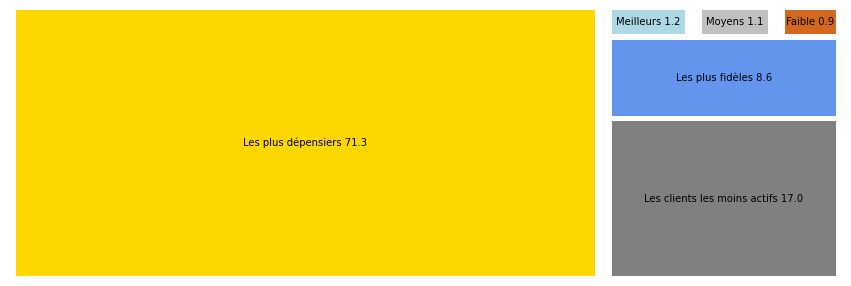

In [16]:
plt.figure(figsize=(15, 5))
color = ['gold', 'grey', 'cornflowerblue', 'lightblue', "silver", "chocolate"]
labels = [
    "Les plus dépensiers " +
    str(dict_segment_client_percentage["Les plus dépensiers"]),
    "Les clients les moins actifs " +
    str(dict_segment_client_percentage["Les clients les moins actifs"]),
    "Les plus fidèles " +
    str(dict_segment_client_percentage["Les plus fidèles"]),
    "Meilleurs " + str(dict_segment_client_percentage["Meilleurs clients"]),
    "Moyens " + str(dict_segment_client_percentage["Les clients moyens"]),
    "Faible " +
    str(dict_segment_client_percentage["Les clients faiblement actifs"]),
]
squarify.plot(sorted(dict_segment_client.values(), reverse=True),
              color=color,
              label=labels,
              pad=True)
plt.axis('off')
plt.show()

Maintenant que nous connaissons les segments de notre clientèle, nous pouvons choisir comment cibler ou traiter chaque segment.

**Les meilleurs clients** : donner la possibilité de "Parrainer un ami" en offrant des bons d'achat/cadeaux, etc.

**Les clients les plus fidèles** : augmenter leur panier moyen étant donné que ce sont les clients ayant une haute fréquence d'achat, cela permettra d'augmenter leurs montants totaux. Recommander des produits selon leurs habitudes d'achats, comme des accessoires par exemple.

**Les clients les plus dépensiers** : augmenter leur fréquence en proposant une carte de fidélité avec des promotions.

**Les clients moyens** : doivent être un peu plus fidélisé, proposez un bon service après vente, de bonne garantis produits.

**Les clients faiblement actifs** : envoyez des newletters de nouveaux produits et des promotions, en provoquant le sentiment de rater une bonne affaire.


**Les clients les moins actifs** : envoyer des mails personnalisés pour ces clients là afin de les encourager à faire des achats.

Ajoutons maintenant ces commentaires dans la dataframe pour chaque client.

In [17]:
rfm_segmentation

,Unnamed: 0,customer_unique_id,monetary,frequency,recency,R_Quartile,F_Quartile,M_Quartile,RFMScore
0,0,0000366f3b9a7992bf8c76cfdf3221e2,1135.20,1,115,4,1,4,414
1,1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,1,118,4,1,1,411
2,2,0000f46a3911fa3c0805444483337064,689.76,1,541,1,1,4,114
3,3,0000f6ccb0745a6a4b88665a16c9f078,174.48,1,325,2,1,2,212
4,4,0004aac84e0df4da2b147fca70cf8255,1181.34,1,292,2,1,4,214
...,...,...,...,...,...,...,...,...,...
93390,93390,fffcf5a5ff07b0908bd4e2dbc735a684,20674.20,1,451,1,1,4,114
93391,93391,fffea47cd6d3cc0a88bd621562a9d061,84.58,1,266,2,1,2,212
93392,93392,ffff371b4d645b6ecea244b27531430a,112.46,1,572,1,1,2,112
93393,93393,ffff5962728ec6157033ef9805bacc48,668.45,1,123,3,1,4,314


In [18]:
rfm_segmentation

rfm_segmentation['commentaire'] = np.nan

In [19]:
dict_commentaire = {
    "Meilleurs":
    "donner la possibilité de 'Parrainer un ami' en offrant des bons d'achat/cadeaux, etc.",
    "Les plus fidèles":
    "augmenter leur panier moyen étant donné que ce sont les clients ayant une haute fréquence d'achat, cela permettra d'augmenter leurs montants totaux. Recommander des produits selon leurs habitudes d'achats, comme des accessoires par exemple.",
    "Les plus dépensiers":
    "augmenter leur fréquence en proposant une carte de fidélité avec des promotions.",
    "Moyens":
    "doivent être un peu plus fidélisé, proposez un bon service après vente, de bonne garantis produits.",
    "Faibles":
    "envoyez des newletters de nouveaux produits et des promotions, en provoquant le sentiment de rater une bonne affaire.",
    "Les clients les moins actifs":
    "envoyer des mails personnalisés pour ces clients là afin de les encourager à faire des achats."
}

In [20]:
rfm_segmentation.loc[rfm_segmentation['RFMScore'] == 444,
                     'commentaire'] = dict_commentaire["Meilleurs"]
rfm_segmentation.loc[rfm_segmentation['F_Quartile'] == 4,
                     'commentaire'] = dict_commentaire["Les plus fidèles"]
rfm_segmentation.loc[rfm_segmentation['M_Quartile'] == 4,
                     'commentaire'] = dict_commentaire["Les plus dépensiers"]
rfm_segmentation.loc[rfm_segmentation['RFMScore'] == 244,
                     'commentaire'] = dict_commentaire["Moyens"]
rfm_segmentation.loc[rfm_segmentation['RFMScore'] == 144,
                     'commentaire'] = dict_commentaire["Faibles"]
rfm_segmentation.loc[
    rfm_segmentation['RFMScore'] == 111,
    'commentaire'] = dict_commentaire["Les clients les moins actifs"]

In [21]:
rfm_segmentation

,Unnamed: 0,customer_unique_id,monetary,frequency,recency,R_Quartile,F_Quartile,M_Quartile,RFMScore,commentaire
0,0,0000366f3b9a7992bf8c76cfdf3221e2,1135.20,1,115,4,1,4,414,augmenter leur fréquence en proposant une cart...
1,1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,1,118,4,1,1,411,NaN
2,2,0000f46a3911fa3c0805444483337064,689.76,1,541,1,1,4,114,augmenter leur fréquence en proposant une cart...
3,3,0000f6ccb0745a6a4b88665a16c9f078,174.48,1,325,2,1,2,212,NaN
4,4,0004aac84e0df4da2b147fca70cf8255,1181.34,1,292,2,1,4,214,augmenter leur fréquence en proposant une cart...
...,...,...,...,...,...,...,...,...,...,...
93390,93390,fffcf5a5ff07b0908bd4e2dbc735a684,20674.20,1,451,1,1,4,114,augmenter leur fréquence en proposant une cart...
93391,93391,fffea47cd6d3cc0a88bd621562a9d061,84.58,1,266,2,1,2,212,NaN
93392,93392,ffff371b4d645b6ecea244b27531430a,112.46,1,572,1,1,2,112,NaN
93393,93393,ffff5962728ec6157033ef9805bacc48,668.45,1,123,3,1,4,314,augmenter leur fréquence en proposant une cart...


In [22]:
x = rfm_segmentation['recency']
y = rfm_segmentation['frequency']
z = rfm_segmentation['monetary']

fig = go.Figure(data=[
    go.Scatter3d(
        x=x,
        y=y,
        z=z,
        mode='markers',
        marker=dict(
            size=2,
            color=rfm_segmentation['RFMScore'],
            # colorscale='thermal',
            opacity=0.8))
])

fig.update_layout(scene=dict(xaxis_title='Récence',
                             yaxis_title='Fréquence',
                             zaxis_title='Montant'),
                  width=700,
                  margin=dict(r=20, b=10, l=10, t=10))

fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

Passons maintenant aux modèles.

## Scaling et encoding

In [23]:
rfm_df_scaled = rfm_df[['monetary', 'frequency', 'recency']]
df_clustering_scaled = df[[
    'payment_type',
    'customer_city',
    'review_score',
]]

df_clustering_scaled_concat = pd.concat(
    [rfm_df_scaled, df_clustering_scaled.head(93395)], axis=1)

In [24]:
df_clustering_scaled_concat

,monetary,frequency,recency,payment_type,customer_city,review_score
0,1135.20,1,115,credit_card,sao paulo,4
1,27.19,1,118,credit_card,sao paulo,4
2,689.76,1,541,credit_card,sao paulo,5
3,174.48,1,325,boleto,florianopolis,3
4,1181.34,1,292,credit_card,sao paulo,1
...,...,...,...,...,...,...
93390,20674.20,1,451,debit_card,sao bernardo do campo,5
93391,84.58,1,266,credit_card,sao paulo,3
93392,112.46,1,572,boleto,americana,5
93393,668.45,1,123,voucher,colatina,5


In [25]:
%%time
# Nous devons encoder nos données de la variable df_clustering_scaled_concat étant
# donnée qu'elle contient des données non numériques.

# Encodage à chaud
df_clustering_scaled_concat = pd.get_dummies(df_clustering_scaled_concat)

CPU times: user 332 ms, sys: 172 ms, total: 504 ms
Wall time: 503 ms


In [26]:
# Nous normalisation nos données avec StandardScaler
scaler = StandardScaler()

rfm_df_scaled = scaler.fit_transform(rfm_df_scaled)
print(rfm_df_scaled.shape)

df_clustering_scaled_concat = scaler.fit_transform(
    df_clustering_scaled_concat.sample(40000))
print(df_clustering_scaled_concat.shape)

(93395, 3)
(40000, 4067)


In [27]:
rfm_df_scaled = pd.DataFrame(rfm_df_scaled)
rfm_df_scaled.columns = ['monetary', 'frequency', 'recency']
rfm_df_scaled.head()

,monetary,frequency,recency
0,0.268757,-0.160427,-0.827501
1,-0.376336,-0.160427,-0.807914
2,0.009418,-0.160427,1.953891
3,-0.290583,-0.160427,0.543608
4,0.295620,-0.160427,0.328148


Passons maintenant à la partie modelling.

# Type de paiement, ville, catégorie de produit, score et RFM

## K-means

Le principe est de laisser la machine apprendre à classer nos données selon leur ressemblance. Un des algorithmes les plus populaires est le **K-means clustering**.

In [28]:
%%time
# k-means avec un certain nombre de k arbitraires
kmeans = KMeans(n_clusters=7, max_iter=1000)
kmeans.fit(df_clustering_scaled_concat)

CPU times: user 51.4 s, sys: 1.32 s, total: 52.8 s
Wall time: 11.4 s


KMeans(max_iter=1000, n_clusters=7)

In [29]:
# Liste les clusters de chaque client
# (Ce client dans le cluster 0, celui-ci dans le cluster 1, etc.)
kmeans.labels_

array([3, 3, 3, ..., 3, 3, 3], dtype=int32)

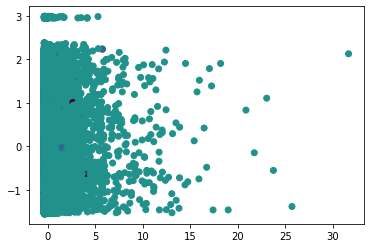

In [30]:
plt.scatter(df_clustering_scaled_concat[:, 0],
            df_clustering_scaled_concat[:, 2],
            c=kmeans.predict(df_clustering_scaled_concat))

Recherche des meilleurs **hyperparamètres avec GridSearchCV**.

In [31]:
%%time
model = KMeans(n_clusters=10, init='random', n_init=10)
b = model.fit(df_clustering_scaled_concat).labels_

sc = make_scorer(adjusted_rand_score)
parameters = {
    'init': ('k-means++', 'random'),
    'max_iter': [100, 200, 300],
    'n_init': [5, 10, 15]
}

clf = GridSearchCV(model, parameters, scoring=sc)
clf.fit(df_clustering_scaled_concat, b)

print("Best parameters: " + str(clf.best_params_))

Best parameters: {'init': 'random', 'max_iter': 200, 'n_init': 15}
CPU times: user 1h 36min 15s, sys: 1min 44s, total: 1h 37min 59s
Wall time: 17min 56s


In [32]:
%%time
pca = decomposition.PCA(n_components=32).fit(df_clustering_scaled_concat)
X_projected = pca.transform(df_clustering_scaled_concat)

print(pca.explained_variance_ratio_.cumsum())

[0.00067459 0.0010451  0.00140795 0.00176931 0.00212089 0.00246711
 0.00280746 0.00313539 0.0034597  0.00378368 0.00410758 0.00443146
 0.00475533 0.00507919 0.00540304 0.00572688 0.00605071 0.00637453
 0.00669835 0.00702217 0.00734598 0.00766979 0.0079936  0.0083174
 0.00864121 0.00896501 0.0092888  0.0096126  0.00993639 0.01026018
 0.01058397 0.01090776]
CPU times: user 12.9 s, sys: 441 ms, total: 13.4 s
Wall time: 3.88 s


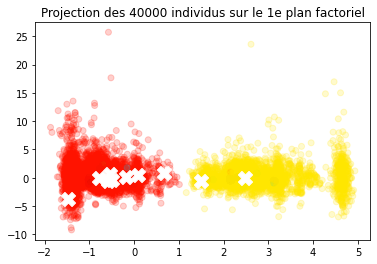

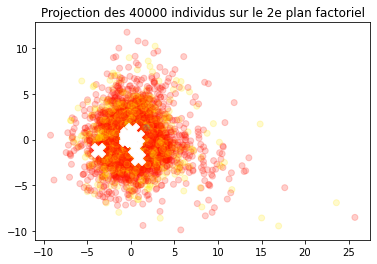

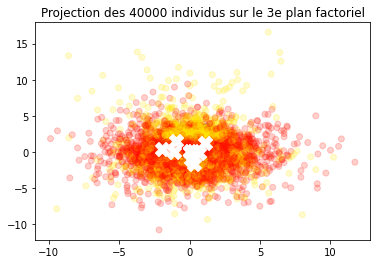

CPU times: user 2min 12s, sys: 1.3 s, total: 2min 13s
Wall time: 20.8 s


In [33]:
%%time
X_scaled = df_clustering_scaled_concat
model.fit(X_scaled)

plt.figure()
clusters = model.labels_

centroids = model.cluster_centers_
centroids_projected = pca.transform(centroids)

for i in range(3):
    plt.scatter(X_projected[:, i],
                X_projected[:, i + 1],
                c=clusters.astype(np.float64),
                cmap='jet',
                alpha=.2)
    plt.scatter(centroids_projected[:, i],
                centroids_projected[:, i + 1],
                marker='X',
                color='white',
                alpha=1,
                s=200)

    plt.title("Projection des {} individus sur le {}e plan factoriel".format(
        X_projected.shape[0], i + 1))
    plt.show()

Les résultats sont peu probants pour cette partie K-means avec les données de la dataframe df_clustering_scaled_concat, essayons autre chose, un modèle permet de faire du clustering sans encoder nos variables.

Il s'agit de **K-Prototype**.

## KPROTOTYPE

L'algorithme K-Means est l'une des méthodes de clustering conventionnelles couramment utilisées dans les techniques de clustering et utilisées efficacement pour les données volumineuses. Cependant, le kmeans ne convient pas aux données qui contiennent des variables catégorielles. Ce problème survient lorsque la fonction de cout dans K-Means est calculée à l'aide de la distance euclidienne qui ne convient qu'aux données numériques.

La piste du K-Mode a également été envisagée, mais ce modèle ne convient qu'aux données catégorielles, et non aux types de données mixtes.

Face à ces problèmes, Huang a proposé un algorithme appelé K-Prototype qui a été créé afin de gérer les algorithmes de clustering avec les types de données mixtes (variables numériques et catégorielles). K-Prototype est une méthode de clustering basée sur le partitionnement. Son algorithme est une amélioration de l'algorithme de clustering K-Means et K-Mode pour gérer le clustering avec les types de données mixtes.

In [34]:
df_features = df_clustering_scaled_concat = pd.concat(
    [rfm_df_scaled, df_clustering_scaled.head(93395)], axis=1)

In [35]:
categorical_ = []
integer_ = []
float_ = []
bool_ = []

# L'argument 'categorical' de la fonction kprototype doit être un entier
# avec l'index de la colonne catégorique dans les données, une liste
# ou un tuple de plusieurs d'entre elles.
categorical_column_index = []
i = 0
for index, value in df_features.dtypes.items():
    if value == 'object':
        categorical_.append(index)
        categorical_column_index.append(i)
    elif value == 'int64':
        integer_.append(index)
    elif value == 'float64':
        float_.append(index)
    elif value == 'bool':
        bool_.append(index)
    i += 1

numerical_ = integer_ + float_
features = categorical_ + integer_ + float_ + bool_
print("categorical features:", len(categorical_))
print("numerical features:", len(numerical_))
print("total features:", len(features))

categorical features: 2
numerical features: 4
total features: 6


Courbe du coude pour trouver le nombre de K optimal.

In [36]:
%%time
# 1h d'execution
cost = []
K = range(1, 10)
for num_clusters in tqdm(list(K)):
    kprototype = KPrototypes(n_clusters=num_clusters,
                             init="random",
                             n_init=5,
                             verbose=1)
    kprototype.fit_predict(df_features, categorical=categorical_column_index)
    cost.append(kprototype.cost_)

  0%|          | 0/9 [00:00<?, ?it/s]

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 0, ncost: 551434.9103692194
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/100, moves: 0, ncost: 551434.9103692194
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 3, iteration: 1/100, moves: 0, ncost: 551434.9103692194
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 4, iteration: 1/100, moves: 0, ncost: 551434.9103692194
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 5, iteration: 1/100, moves: 0, ncost: 551434.9103692194
Best run was number 1
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 3620, ncost: 480154.9820203783
Run: 1, iteration: 2/100, moves: 1039, ncost: 477706.465096558
Run: 1, iteration: 3/100, moves: 488, ncost: 476558.5068059133
Run

Run: 2, iteration: 2/100, moves: 4045, ncost: 346709.0863408869
Run: 2, iteration: 3/100, moves: 703, ncost: 346527.4668900577
Run: 2, iteration: 4/100, moves: 466, ncost: 346422.9127456834
Run: 2, iteration: 5/100, moves: 393, ncost: 346351.64148085366
Run: 2, iteration: 6/100, moves: 269, ncost: 346330.8351320401
Run: 2, iteration: 7/100, moves: 179, ncost: 346322.58024101396
Run: 2, iteration: 8/100, moves: 96, ncost: 346319.99964893487
Run: 2, iteration: 9/100, moves: 58, ncost: 346319.8024676873
Run: 2, iteration: 10/100, moves: 28, ncost: 346319.76139942405
Run: 2, iteration: 11/100, moves: 12, ncost: 346319.7146429444
Run: 2, iteration: 12/100, moves: 3, ncost: 346319.6363326391
Run: 2, iteration: 13/100, moves: 17, ncost: 346319.3787147258
Run: 2, iteration: 14/100, moves: 17, ncost: 346319.3336355532
Run: 2, iteration: 15/100, moves: 6, ncost: 346319.30527661036
Run: 2, iteration: 16/100, moves: 11, ncost: 346319.2349138916
Run: 2, iteration: 17/100, moves: 3, ncost: 346319.23

Run: 5, iteration: 10/100, moves: 89, ncost: 300354.8416884693
Run: 5, iteration: 11/100, moves: 45, ncost: 300354.7728259789
Run: 5, iteration: 12/100, moves: 29, ncost: 300354.73767622653
Run: 5, iteration: 13/100, moves: 5, ncost: 300354.73605438904
Run: 5, iteration: 14/100, moves: 0, ncost: 300354.73605438904
Best run was number 2
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 28668, ncost: 230261.09701217597
Run: 1, iteration: 2/100, moves: 11072, ncost: 225696.86604961572
Run: 1, iteration: 3/100, moves: 3058, ncost: 225300.06484076352
Run: 1, iteration: 4/100, moves: 1810, ncost: 225119.33787772
Run: 1, iteration: 5/100, moves: 1396, ncost: 225018.8716583005
Run: 1, iteration: 6/100, moves: 504, ncost: 225006.6082819653
Run: 1, iteration: 7/100, moves: 129, ncost: 225005.78432653708
Run: 1, iteration: 8/100, moves: 43, ncost: 225005.70139500918
Run: 1, iter

Run: 2, iteration: 21/100, moves: 5374, ncost: 215144.11250914822
Run: 2, iteration: 22/100, moves: 1259, ncost: 215091.87382153058
Run: 2, iteration: 23/100, moves: 719, ncost: 215078.40564031567
Run: 2, iteration: 24/100, moves: 397, ncost: 215074.20418128057
Run: 2, iteration: 25/100, moves: 238, ncost: 215072.80903207615
Run: 2, iteration: 26/100, moves: 60, ncost: 215072.65733084065
Run: 2, iteration: 27/100, moves: 3, ncost: 215072.65670905667
Run: 2, iteration: 28/100, moves: 0, ncost: 215072.65670905667
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 3, iteration: 1/100, moves: 20212, ncost: 222264.37723892654
Run: 3, iteration: 2/100, moves: 7964, ncost: 220111.73556643687
Run: 3, iteration: 3/100, moves: 2139, ncost: 219847.63881969868
Run: 3, iteration: 4/100, moves: 3147, ncost: 216465.90466210796
Run: 3, iteration: 5/100, moves: 3900, ncost: 214192.22769996378
Run: 3, iteration: 6/100, moves: 1479, ncost: 213197.264156424
Run: 3, iterat

Run: 4, iteration: 23/100, moves: 81, ncost: 206391.82199254128
Run: 4, iteration: 24/100, moves: 73, ncost: 206391.64390479506
Run: 4, iteration: 25/100, moves: 68, ncost: 206391.52350716334
Run: 4, iteration: 26/100, moves: 133, ncost: 206390.9945102664
Run: 4, iteration: 27/100, moves: 74, ncost: 206390.82184687053
Run: 4, iteration: 28/100, moves: 22, ncost: 206390.79427172983
Run: 4, iteration: 29/100, moves: 9, ncost: 206390.79109225373
Run: 4, iteration: 30/100, moves: 2, ncost: 206390.79064217967
Run: 4, iteration: 31/100, moves: 5, ncost: 206390.78878038208
Run: 4, iteration: 32/100, moves: 2, ncost: 206390.7885804363
Run: 4, iteration: 33/100, moves: 1, ncost: 206390.7884574951
Run: 4, iteration: 34/100, moves: 0, ncost: 206390.7884574951
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 5, iteration: 1/100, moves: 20875, ncost: 

Run: 5, iteration: 2/100, moves: 6753, ncost: 204064.88071352645
Run: 5, iteration: 3/100, moves: 4811, ncost: 202303.4337996775
Run: 5, iteration: 4/100, moves: 3991, ncost: 201192.4879413737
Run: 5, iteration: 5/100, moves: 2818, ncost: 200797.21074618603
Run: 5, iteration: 6/100, moves: 3016, ncost: 200373.41065219388
Run: 5, iteration: 7/100, moves: 3434, ncost: 199695.83562517742
Run: 5, iteration: 8/100, moves: 2024, ncost: 199451.5450117818
Run: 5, iteration: 9/100, moves: 1221, ncost: 199372.03372413432
Run: 5, iteration: 10/100, moves: 827, ncost: 199336.29399512327
Run: 5, iteration: 11/100, moves: 433, ncost: 199328.71151176057
Run: 5, iteration: 12/100, moves: 529, ncost: 199308.38060448956
Run: 5, iteration: 13/100, moves: 757, ncost: 199273.52939595995
Run: 5, iteration: 14/100, moves: 465, ncost: 199261.44412734744
Run: 5, iteration: 15/100, moves: 189, ncost: 199259.23582594877
Run: 5, iteration: 16/100, moves: 130, ncost: 199258.2445425832
Run: 5, iteration: 17/100, mo

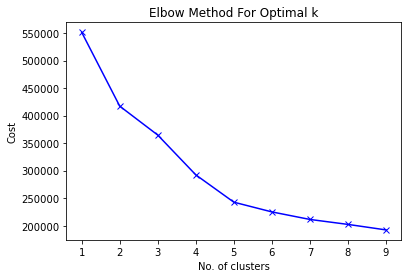

In [37]:
plt.plot(K, cost, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')
plt.show()

Le nombre de k optimal à l'air d'être entre 3 et 5.

In [38]:
def pca_kprototype_clusters(dataframe, algorithm, args, kwds,
                            categorical_index_col):
    """
    Fonction permettant de générer une projection PCA de clusters

    Entrée :
    - dataframe - unscaled dataframe
    - algorithm - algorithme de clustering
    - args - arguments de l'algorithme, liste
    - kwds - paramètres de l'algorithme, dictionnaire

    Sortie :
    - Aucun (nuage de points 3D interactif)
    """
    start_time = time.time()
    scaler = StandardScaler()

    le = LabelEncoder()
    for index_col in categorical_index_col:
        dataframe.iloc[:,
                       index_col] = le.fit_transform(dataframe.iloc[:,
                                                                    index_col])

    scaled_data = scaler.fit_transform(dataframe)
    labels = algorithm(*args,
                       **kwds).fit_predict(scaled_data,
                                           categorical=categorical_index_col)
    pca = decomposition.PCA(n_components=2).fit(scaled_data)
    X_projected = pca.transform(scaled_data)
    pca_df = pd.DataFrame(X_projected)
    pca_df['cluster'] = labels
    pca_df.columns = ['x1', 'x2', 'cluster']
    end_time = time.time()
    sns.scatterplot(data=pca_df,
                    x='x1',
                    y='x2',
                    hue='cluster',
                    legend="full",
                    alpha=0.7).set_title('Clusters trouvés par {}'.format(
                        str(algorithm.__name__)))
    print(f"Le clustering a pris {round(end_time - start_time)}s")

Le clustering a pris 349s
CPU times: user 5min 50s, sys: 6.48 s, total: 5min 56s
Wall time: 5min 48s


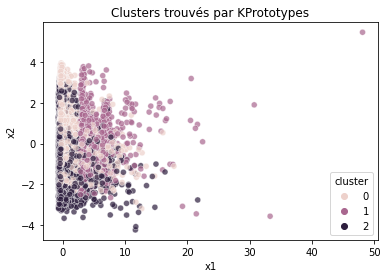

In [39]:
%%time
pca_kprototype_clusters(df_features, KPrototypes, (), {
    'n_clusters': 3,
    'init': "random",
    'n_init': 5
}, categorical_column_index)

Le clustering a pris 415s
CPU times: user 6min 57s, sys: 7.04 s, total: 7min 4s
Wall time: 6min 55s


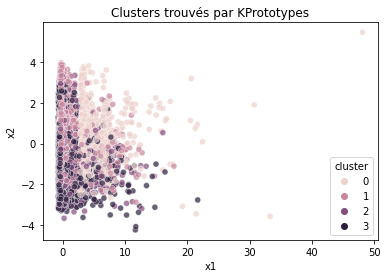

In [40]:
%%time
pca_kprototype_clusters(df_features, KPrototypes, (), {
    'n_clusters': 4,
    'init': "random",
    'n_init': 5
}, categorical_column_index)

Le clustering a pris 331s
CPU times: user 5min 32s, sys: 5.43 s, total: 5min 38s
Wall time: 5min 31s


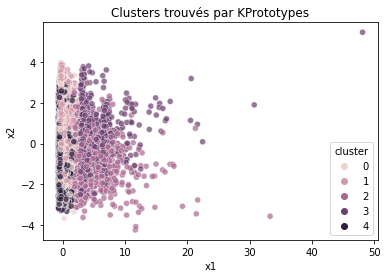

In [41]:
%%time
pca_kprototype_clusters(df_features, KPrototypes, (), {
    'n_clusters': 5,
    'init': "random",
    'n_init': 5
}, categorical_column_index)

## DBSCAN

In [42]:
df_features_dbscan = pd.concat(
    [rfm_df_scaled, df_clustering_scaled.head(93395)], axis=1)

# Encodage à chaud
df_features_dbscan = pd.get_dummies(df_features_dbscan)

df_features_dbscan_sample = df_features_dbscan.sample(10000)

df_features_dbscan = scaler.fit_transform(df_features_dbscan_sample)

### Hyperparamètres

In [43]:
%%time
neighbors = NearestNeighbors(n_neighbors=6)
neighbors_fit = neighbors.fit(df_features_dbscan)
distances, indices = neighbors_fit.kneighbors(df_features_dbscan)

CPU times: user 12.1 s, sys: 978 ms, total: 13.1 s
Wall time: 4.6 s


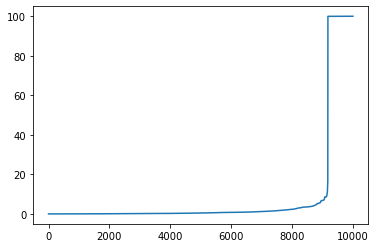

In [44]:
distances = np.sort(distances, axis=0)
distances = distances[:, 1]
plt.plot(distances)

Le "coude" est très peu précis sur le graphique, nous allons zoomer sur celui-ci pour avoir une visualisation plus précise.

(9000.0, 9200.0)

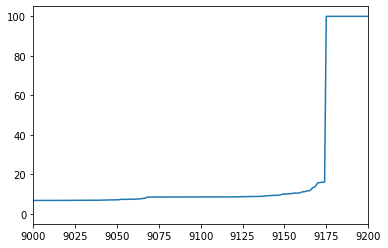

In [45]:
# Zoom sur le "coude" de la courbe pour connaitre la valeur optimale de l'epsilon
plt.plot(distances)
plt.xlim([9000, 9200])

L'epsilon le plus optimal se situe à priori entre 17 et 20.

Le clustering a pris 17s


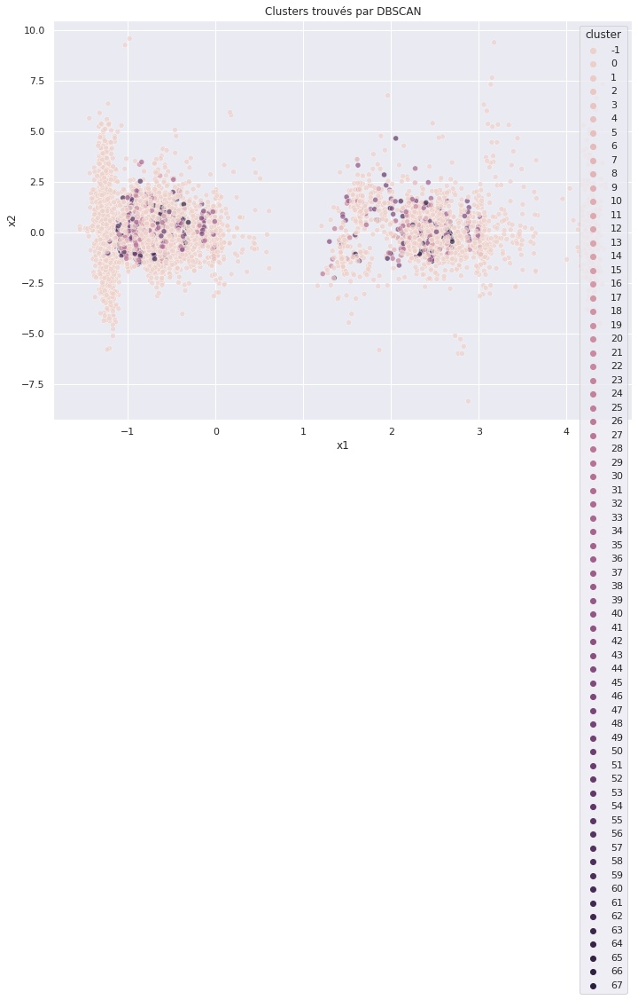

In [46]:
pca_clusters(
    df_features_dbscan_sample,
    cluster.DBSCAN,
    (),
    {
        'eps': 17,
        'min_samples': 15,
        # n_jobs = nombre de processeurs utilisés (4 coeurs)
        'n_jobs': 4
    })

Le clustering a pris 14s


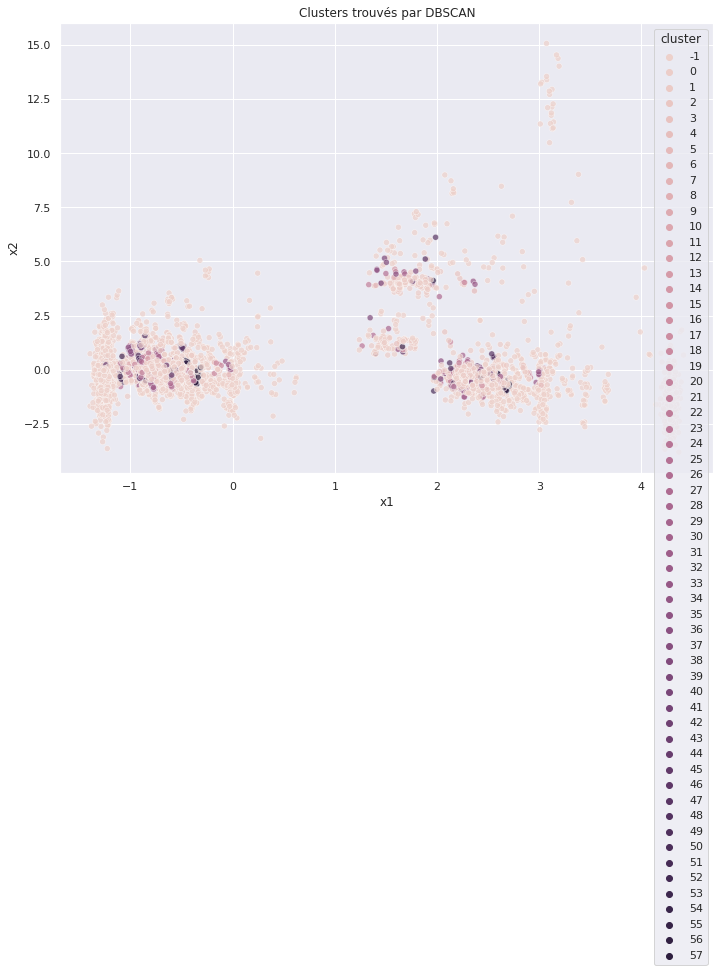

In [47]:
pca_clusters(
    df_features_dbscan_sample,
    cluster.DBSCAN,
    (),
    {
        'eps': 18,
        'min_samples': 15,
        # n_jobs = nombre de processeurs utilisés (4 coeurs)
        'n_jobs': 4
    })

Le clustering a pris 21s


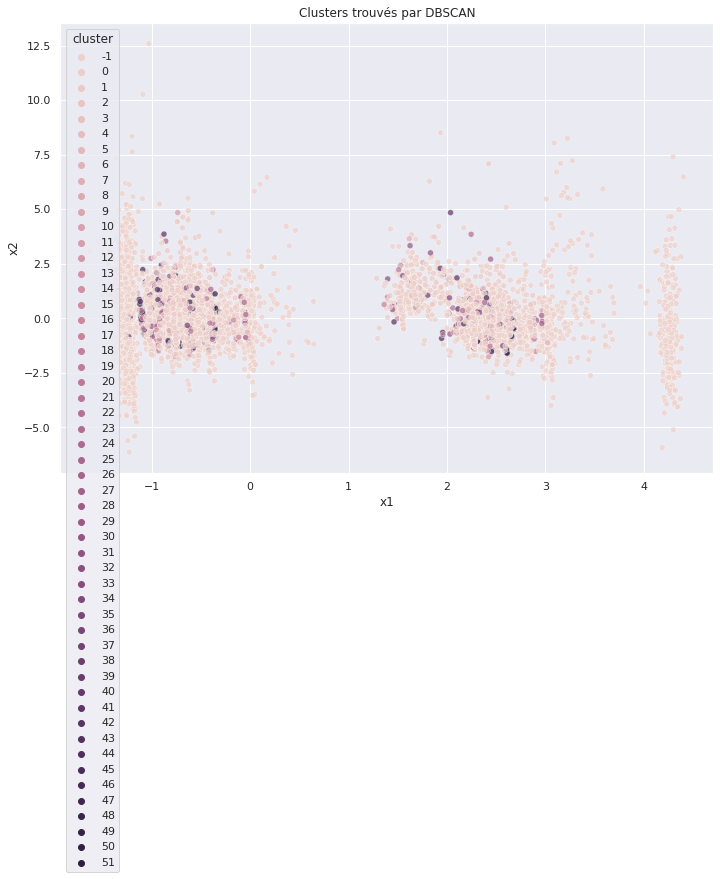

In [48]:
pca_clusters(
    df_features_dbscan_sample,
    cluster.DBSCAN,
    (),
    {
        'eps': 19,
        'min_samples': 15,
        # n_jobs = nombre de processeurs utilisés (4 coeurs)
        'n_jobs': 4
    })

Le clustering a pris 17s


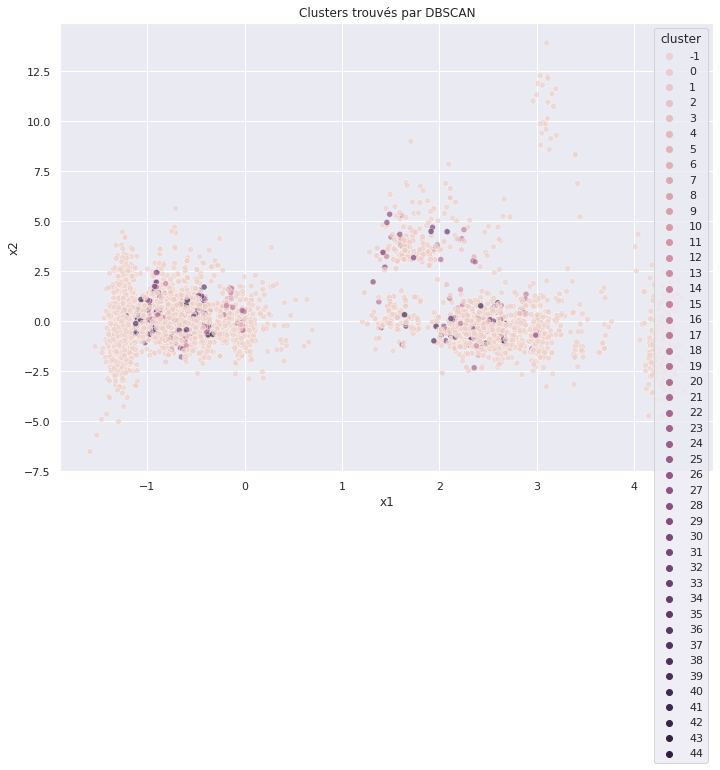

In [49]:
pca_clusters(
    df_features_dbscan_sample,
    cluster.DBSCAN,
    (),
    {
        'eps': 20,
        'min_samples': 15,
        # n_jobs = nombre de processeurs utilisés (4 coeurs)
        'n_jobs': 4
    })

Le nombre de clusters est beaucoup trop élevé, passons à la partie RFM seule.

# RFM

## K-means

In [50]:
# k-means avec un certain nombre de k arbitraires
kmeans = KMeans(n_clusters=5, max_iter=50)
kmeans.fit(rfm_df_scaled)

KMeans(max_iter=50, n_clusters=5)

In [51]:
# Liste les clusters de chaque client
# (Ce client dans le cluster 0, celui-ci dans le cluster 1, etc.)
kmeans.labels_

array([2, 2, 0, ..., 0, 2, 0], dtype=int32)

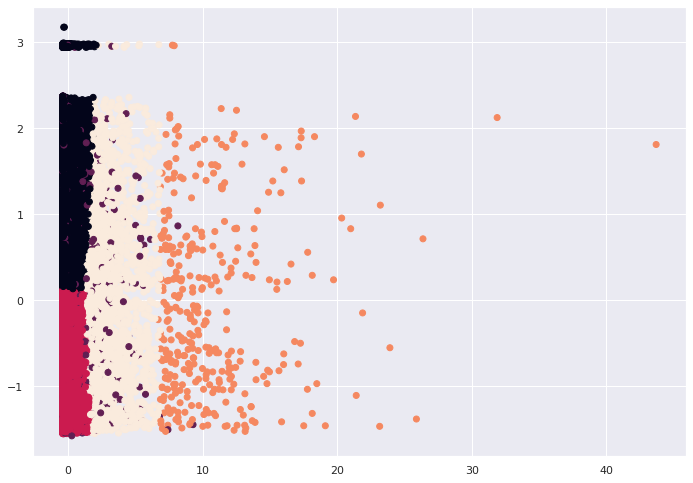

In [52]:
plt.scatter(rfm_df_scaled.iloc[:, 0],
            rfm_df_scaled.iloc[:, 2],
            c=kmeans.predict(rfm_df_scaled))

Il y a l'air d'y avoir une cohérence sur la visualisation de nos clusters.

- **Le cluster en bas à gauche** qui regroupe les clients les moins actifs (que ce soit en récence, fréquence et montant).
- **Le cluster en haut à gauche** qui achète souvent, mais avec un faible montant.
- **Le cluster du milieu** qui achète moyennement souvent avec un montant moyen.
- **Le cluster du milieu en petite quantité (violet)** qui à une fréquence variable mais un montant moyen/faible.
- **Et le cluster à droite** qui lui représente le cluster le plus intéressant avec une fréquence variable, mais toujours un montant élevé avec aussi quelques valeurs atypiques.

Le montant en abscisse, la fréquence en ordonnée.

## Trouver le nombre optimal de clusters

La méthode du coude permet de connaitre a bon nombre de clusters pour notre modèle K-means.

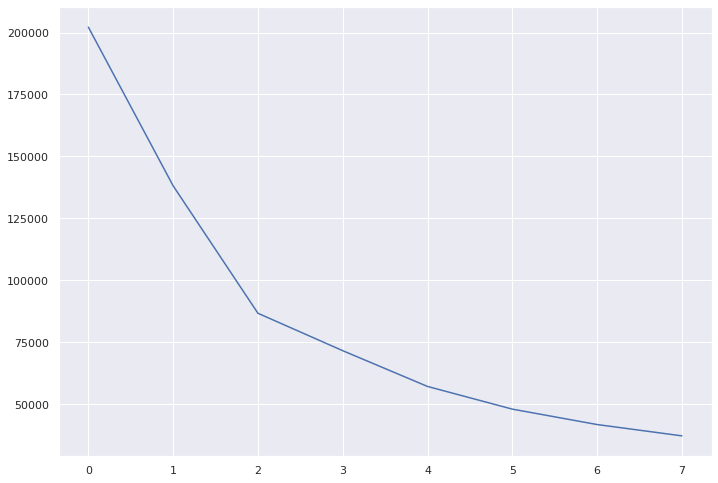

In [53]:
# Methode du coude
# ssd = inertie
ssd = []
range_n_clusters = range(2, 10)
for num_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=num_clusters, max_iter=50)
    kmeans.fit(rfm_df_scaled)

    ssd.append(kmeans.inertia_)

plt.plot(ssd)

On pourrait dire que le nombre de clusters optimal serait entre 2 et 4, faisons une analyse silhouette pour avoir une précision plus grande.

### Silhouette Analyse 

L'analyse silhouette ajoute plus de précision pour connaitre le nombre de clusters optimal.

Le score le plus élevé avant une diminution est le score à retenir, et donc son nombre de n_clusters.

In [54]:
%%time
# Silhouette Analyse
range_n_clusters = range(2, 10)

for num_clusters in range_n_clusters:

    # intialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, max_iter=50)
    kmeans.fit(rfm_df_scaled)

    cluster_labels = kmeans.labels_

    # silhouette score
    silhouette_avg = silhouette_score(rfm_df_scaled, cluster_labels)
    print("Pour n_clusters={0}, le silhouette score est {1}".format(
        num_clusters, silhouette_avg))

Pour n_clusters=2, le silhouette score est 0.7459489561505664
Pour n_clusters=3, le silhouette score est 0.4851141436131502
Pour n_clusters=4, le silhouette score est 0.5164499656166153
Pour n_clusters=5, le silhouette score est 0.5281266170005021
Pour n_clusters=6, le silhouette score est 0.47463297167493756
Pour n_clusters=7, le silhouette score est 0.4765954772827432
Pour n_clusters=8, le silhouette score est 0.49006628774612887
Pour n_clusters=9, le silhouette score est 0.44163874590342334
CPU times: user 14min 51s, sys: 2min 40s, total: 17min 31s
Wall time: 8min 12s


Le premier score à 2 clusters n'est pas à prendre en compte, la stabilité est trop évidente.

C'est **n_clusters=5** à prendre en compte, puisque le score rediminue à partir de celui-ci.

In [55]:
# Modèle final avec k=5
kmeans = KMeans(n_clusters=5, max_iter=50)
kmeans.fit(rfm_df_scaled)
kmeans.labels_

array([0, 0, 1, ..., 1, 0, 1], dtype=int32)

In [56]:
%%time
# Création d'une nouvelle variable représentant l'id de chaque cluster
rfm_df['cluster_id'] = kmeans.labels_
rfm_df.head()

CPU times: user 10.2 ms, sys: 0 ns, total: 10.2 ms
Wall time: 1.14 ms


,Unnamed: 0,customer_unique_id,monetary,frequency,recency,R_Quartile,F_Quartile,M_Quartile,RFMScore,commentaire,cluster_id
0,0,0000366f3b9a7992bf8c76cfdf3221e2,1135.20,1,115,4,1,4,414,augmenter leur fréquence en proposant une cart...,0
1,1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,1,118,4,1,1,411,NaN,0
2,2,0000f46a3911fa3c0805444483337064,689.76,1,541,1,1,4,114,augmenter leur fréquence en proposant une cart...,1
3,3,0000f6ccb0745a6a4b88665a16c9f078,174.48,1,325,2,1,2,212,NaN,1
4,4,0004aac84e0df4da2b147fca70cf8255,1181.34,1,292,2,1,4,214,augmenter leur fréquence en proposant une cart...,1


<AxesSubplot:xlabel='cluster_id', ylabel='monetary'>

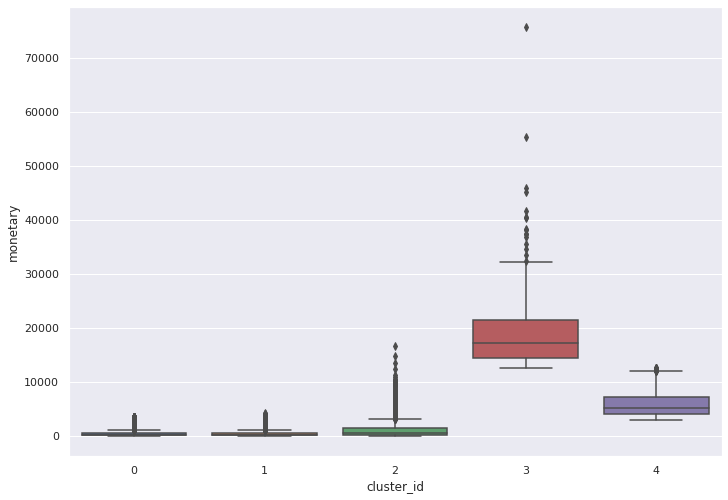

In [57]:
# Trace un boxplot avec les montants par cluster
sns.boxplot(x='cluster_id', y='monetary', data=rfm_df)

In [58]:
rfm_df.groupby(['cluster_id']).sum()

,Unnamed: 0,monetary,frequency,recency,R_Quartile,F_Quartile,M_Quartile,RFMScore
cluster_id,,,,,,,,
0,2352295311,19908225.48,50326,6621150,166384,50326,120531,17262191
1,1727896605,16052492.14,37051,14541553,52187,37051,91005,5680215
2,129499460,3207670.45,5876,624322,7316,11132,9003,851923
3,16384670,6685444.15,369,83718,884,404,1388,93828
4,135190269,17055510.09,2893,706622,7147,2903,11552,755282


Les clients du **cluster_id 3** dépensent plus que les clients des autres clusters.

<AxesSubplot:xlabel='cluster_id', ylabel='frequency'>

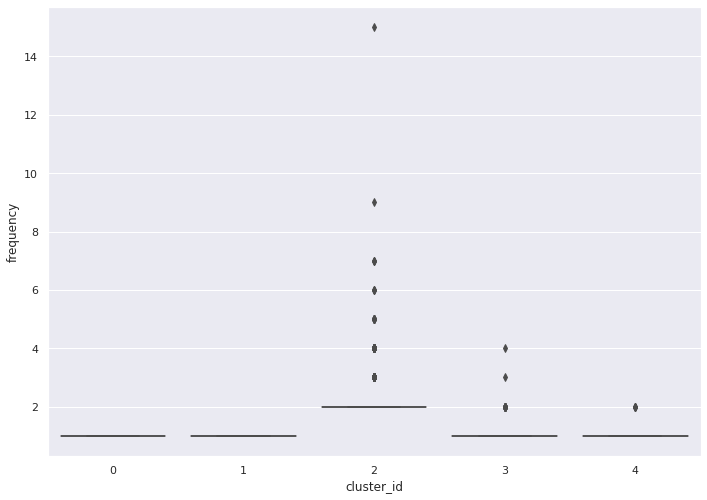

In [59]:
# Trace un boxplot avec les fréquences par cluster
sns.boxplot(x='cluster_id', y='frequency', data=rfm_df)

Les clients du **cluster_id 2** achètent plus souvent que les clients des autres clusters.

<AxesSubplot:xlabel='cluster_id', ylabel='recency'>

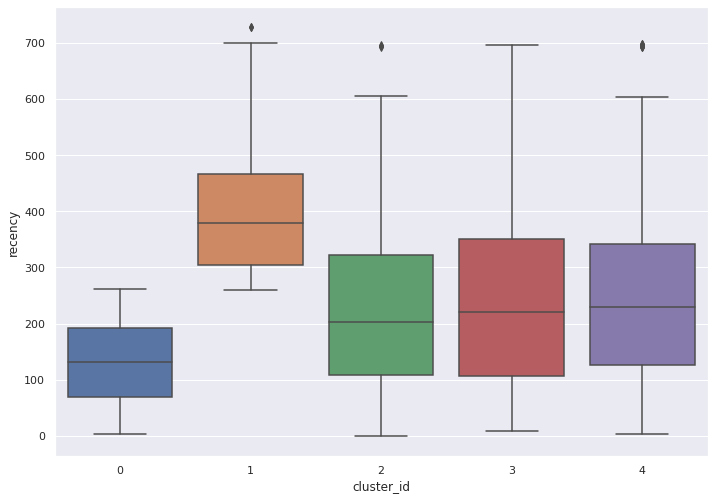

In [60]:
# Trace un boxplot avec les récences par cluster
sns.boxplot(x='cluster_id', y='recency', data=rfm_df)

Les clients du **cluster_id 1** ont effectué des achats plus récemment que les clients des autres clusters.

Exportons nos données pour établir la stabilité dans le temps de notre modèle sur un autre notebook.

In [61]:
rfm_df_ARI = rfm_df[['monetary', 'frequency', 'recency']]

In [62]:
rfm_df_ARI.to_csv('data/rfm_df_ARI.csv', index=False)

## DBSCAN

Avant de nous lancer avec le modèle DBSCAN, nous devons comme avec le K-means (silhouette), trouver les bons hyperparamètres.

Nous pourrons comparer les deux graphiques ensuite (l'un avec les hyperparamètres et l'autre sans).

In [63]:
rfm_pca = rfm_df_scaled.sample(10000)

Le clustering a pris 0s


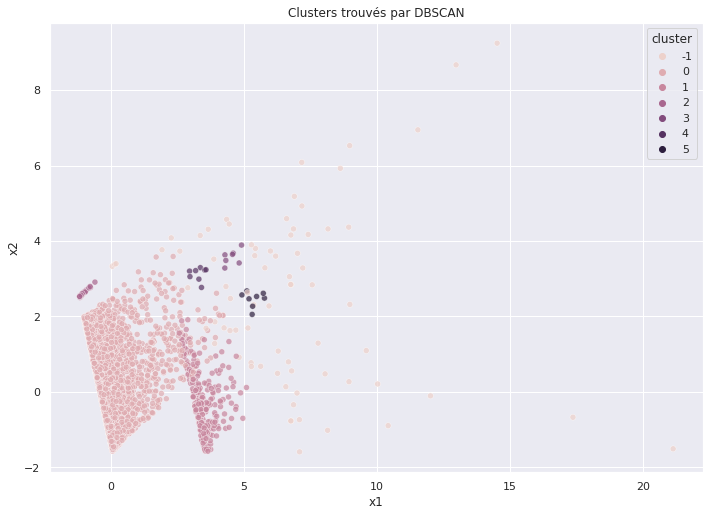

In [64]:
pca_clusters(rfm_pca, cluster.DBSCAN, (), {})

## Hyperparamètres

In [65]:
neighbors = NearestNeighbors(n_neighbors=6)
neighbors_fit = neighbors.fit(rfm_pca)
distances, indices = neighbors_fit.kneighbors(rfm_pca)

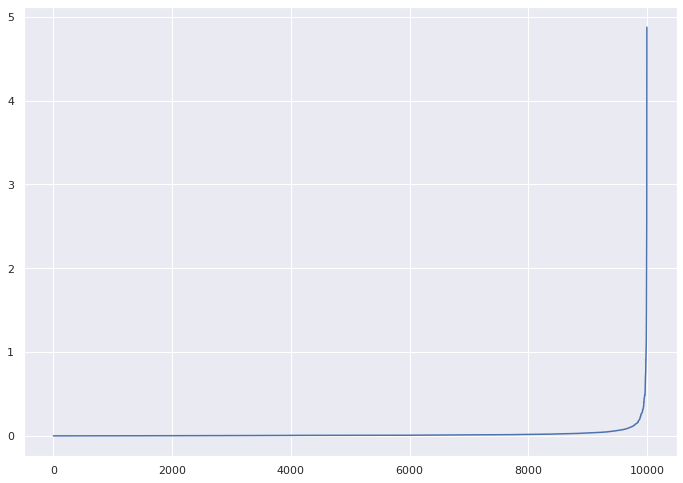

In [66]:
distances = np.sort(distances, axis=0)
distances = distances[:, 1]
plt.plot(distances)

Le "coude" est très peu précis sur le graphique, nous allons zoomer sur celui-ci pour avoir une visualisation plus précise.

(9990.0, 10000.0)

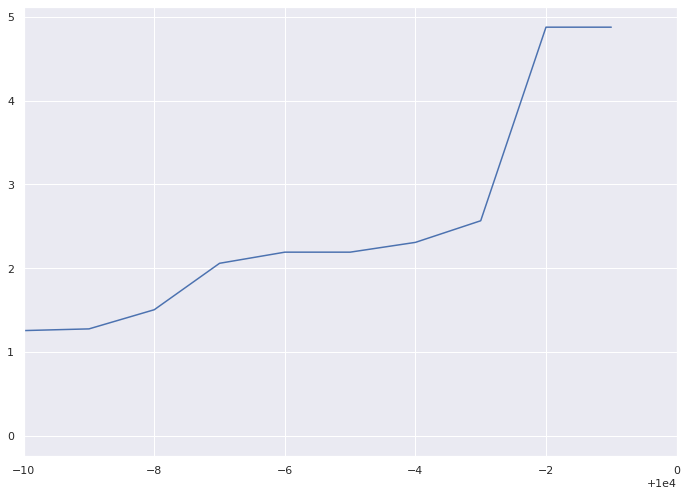

In [67]:
# Zoom sur le "coude" de la courbe pour connaitre la valeur optimale de l'epsilon
plt.plot(distances)
plt.xlim([9990, 10000])

On peut constater que le nombre d'epsilon optimal est de 3 à 5.

Le clustering a pris 1s


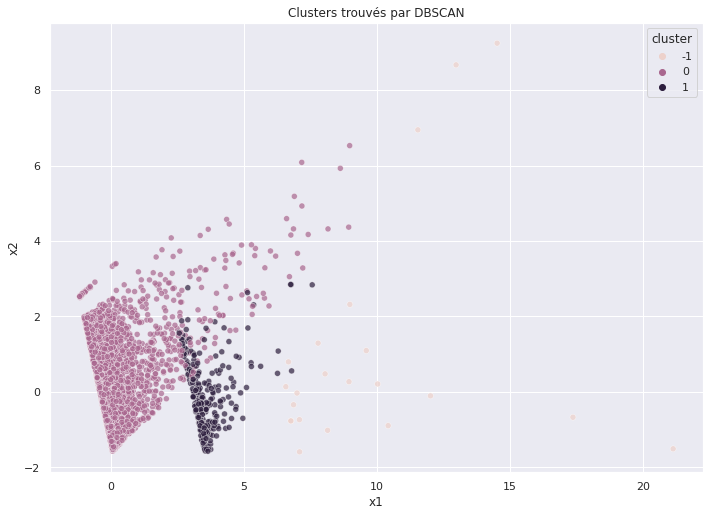

In [68]:
pca_clusters(
    rfm_pca,
    cluster.DBSCAN,
    (),
    {
        'eps': 3,
        'min_samples': 15,
        # n_jobs = nombre de processeurs utilisés (4 coeurs)
        'n_jobs': 4
    })

Le clustering a pris 1s


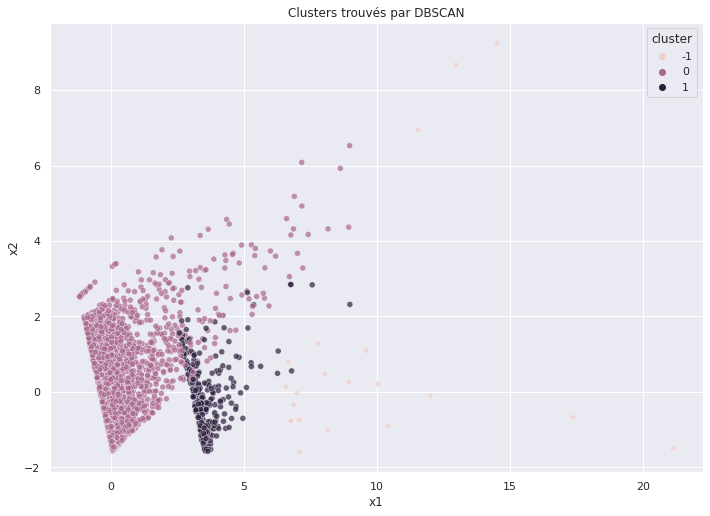

In [69]:
pca_clusters(
    rfm_pca,
    cluster.DBSCAN,
    (),
    {
        'eps': 4,
        'min_samples': 15,
        # n_jobs = nombre de processeurs utilisés (4 coeurs)
        'n_jobs': 4
    })

Le clustering a pris 1s


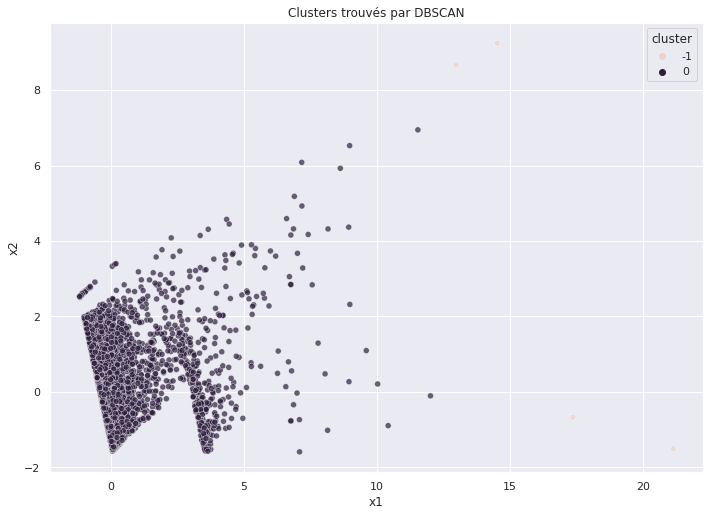

In [70]:
pca_clusters(
    rfm_pca,
    cluster.DBSCAN,
    (),
    {
        'eps': 5,
        'min_samples': 15,
        # n_jobs = nombre de processeurs utilisés (4 coeurs)
        'n_jobs': 4
    })

Nous voyons bien qu'avec les hyperparamètre nous avons un graphique plus réaliste.

Nous avons donc nos 3 clusters (les graphiques ayant pour eps 3 et 4) qui ont l'air de se rapprocher ni du K-means ni de notre RFM manuel. Cela n'est pas très convaincant.

Poursuivons avec un autre modèle, l'AgglomerativeClustering.

## AgglomerativeClustering

### Dendrogramme

Nous pouvons utiliser un dendrogramme pour visualiser l'historique des regroupements et déterminer le nombre optimal de clusters.

In [71]:
def plot_dendrogram(model, **kwargs):
    """
    Fonction établissant une matrice de liaison et trace ensuite le dendrogramme.
    Source : https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html

    Entrée :
    - model - fct, algorithme de clustering
    - **kwargs - paramètres de l'algorithme

    Sortie :
    - Aucun (dendrogramme)
    """
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

In [72]:
# La définition de distance_threshold=0 assure que nous calculons l'arbre
# au complet.
model_aggc = cluster.AgglomerativeClustering(distance_threshold=0,
                                             n_clusters=None)

model_aggc = model_aggc.fit(rfm_pca)

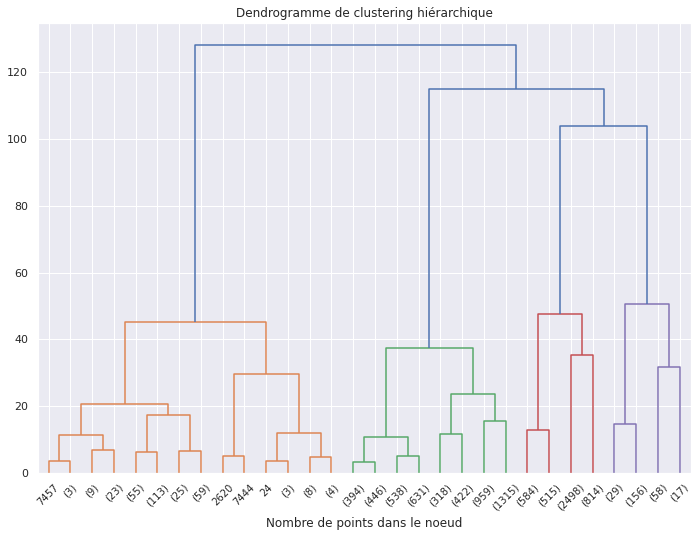

In [73]:
plt.title('Dendrogramme de clustering hiérarchique')
# Trace les trois premiers niveaux du dendrogramme.
plot_dendrogram(model_aggc, truncate_mode='level', p=4)
plt.xlabel("Nombre de points dans le noeud")
plt.show()

On peut voir dans le dendrogramme que le nombre de clusters optimal serait de 4.

Nous allons essayer avec un nombre de clusters allant de 3 à 7.

## PCA

Le clustering a pris 2s


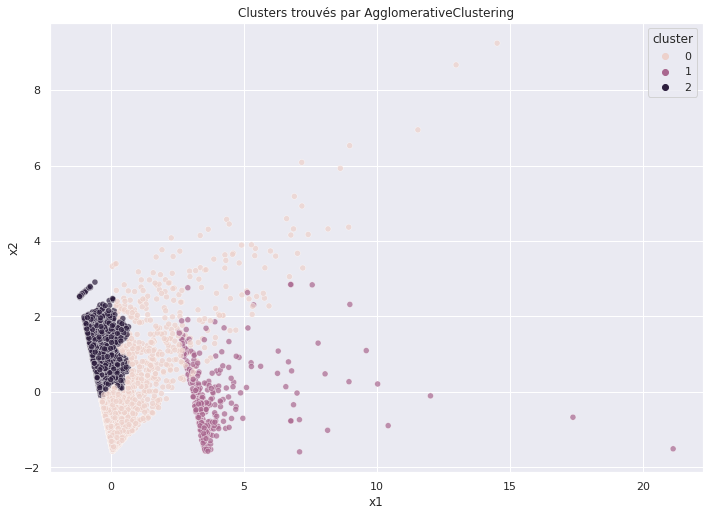

In [74]:
pca_clusters(rfm_pca, cluster.AgglomerativeClustering, (), {'n_clusters': 3})

Le clustering a pris 2s


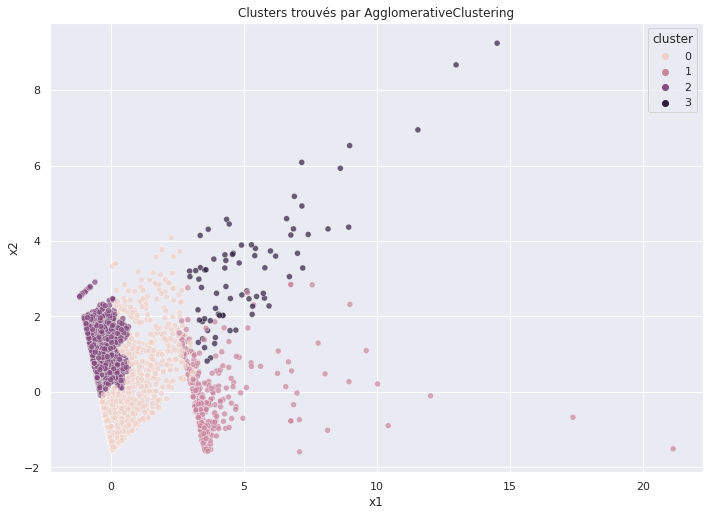

In [75]:
pca_clusters(rfm_pca, cluster.AgglomerativeClustering, (), {'n_clusters': 4})

Le clustering a pris 2s


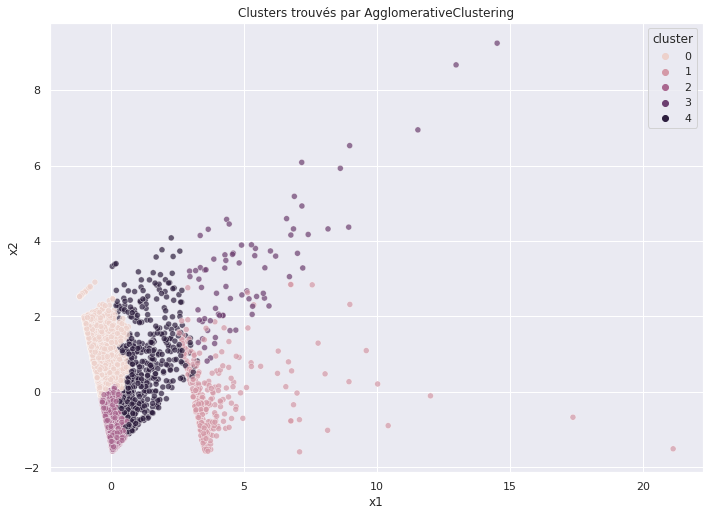

In [76]:
pca_clusters(rfm_pca, cluster.AgglomerativeClustering, (), {'n_clusters': 5})

Le clustering a pris 2s


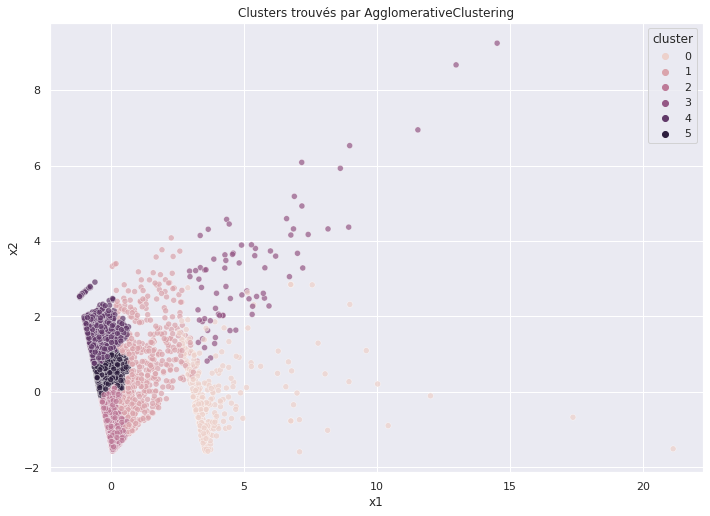

In [77]:
pca_clusters(rfm_pca, cluster.AgglomerativeClustering, (), {'n_clusters': 6})

Le clustering a pris 2s


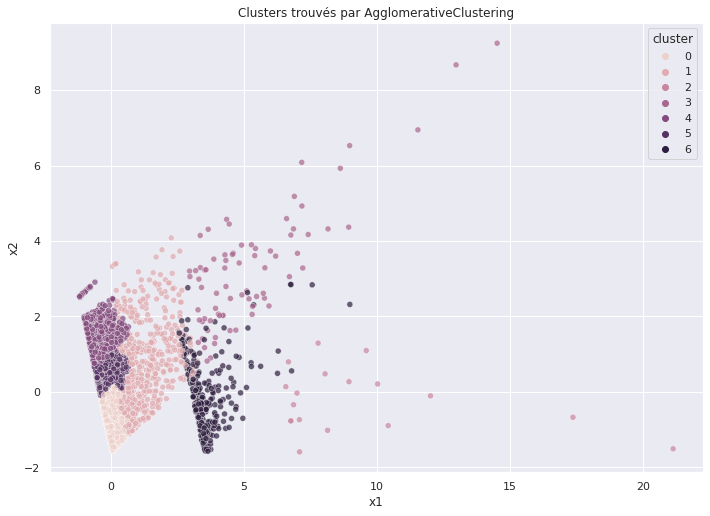

In [78]:
pca_clusters(rfm_pca, cluster.AgglomerativeClustering, (), {'n_clusters': 7})

On peut voir que **5 clusters** est le nombre de clusters le plus optimal, on revoit d'ailleurs un clustering très proche du modèle K-Means.

# Conclusion

En conclusion, l'utilisation du RFM comme jeu de données pour les modèles semble donner des résultats au plus proche de la réalité. Le K-means nous a donné des résultats plus convaincants, plus lisibles, et plus rapides à entrainer.


Si nous faisons un classement, nous aurons parmi les méthodes de clusterings les plus convaincants ceci :

    1- K-means
    2- RFM manuel
    3- Agglomerative clustering
    4- DBSCAN